In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os
import math
from tqdm import tqdm
from keras.preprocessing.image import img_to_array, load_img, array_to_img

PATH = 'dataset/exp-data'
IMG_SIZE = 128
CHANNELS = 3
NOISE_DIM = 100
EPOCHS = 300
EPSILON = 0.00005
BATCH_SIZE = 32 
LEARNING_RATE_DISC=0.00004
LEARNING_RATE_GEN=0.0004
BETA1 = 0.5
WEIGHT_INIT_STDDEV =0.02
ATTEMPT=1

# create numpy array (tensor) for the dataset
train_images = np.ndarray(shape=(6000, IMG_SIZE, IMG_SIZE, CHANNELS), dtype=np.float32)

for i, img in enumerate(os.listdir(PATH)):
    if i >= 6000:
        break
    # using keras image preprocessing package convert the images into a matrix
    image = load_img(PATH + '/' + img)
    x = img_to_array(image)
    
    # add the matrices into the tensor
    train_images[i] = x

train_images.shape

Using TensorFlow backend.


(6000, 128, 128, 3)

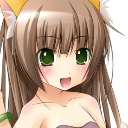

In [2]:
test = array_to_img(train_images[0])
test

In [3]:
train_images = train_images/127.5 - 1 # normalize data to -1 to 1
len(train_images[0])

128

In [4]:
def Generator(Z,training):
    with tf.variable_scope('generator',reuse=not training):
        
        # z = tf.placeholder(tf.float32, (None, noise_dim))
        fully_connected = tf.layers.dense(Z, 8*8*1024)
        fully_connected = tf.layers.batch_normalization(fully_connected)
        fully_connected = tf.nn.leaky_relu(fully_connected)
        
        fully_connected = tf.reshape(fully_connected, (-1, 8, 8, 1024))
        
        print(fully_connected.shape)
        
        
        # 8x8x1024 -> 16x16x512
        conv1 = tf.layers.conv2d_transpose(inputs=fully_connected,
                                           filters=512,
                                           kernel_size=[5,5],
                                           strides=[2,2],
                                           padding='SAME', 
                                           kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV), 
                                           name='g_conv1')
        batch1 = tf.layers.batch_normalization(inputs = conv1,
                                               training=training,
                                               epsilon=EPSILON, 
                                               name='g_batch1')
        A1 = tf.nn.leaky_relu(batch1, name='g_A1')
        
        print(A1.shape)
        
        
        # 16x16x512 -> 32x32x256
        conv2 = tf.layers.conv2d_transpose(inputs=A1,
                                           filters=256,
                                           kernel_size=[5,5],
                                           strides=[2,2],
                                           padding='SAME', 
                                           kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV), 
                                           name='g_conv2')
        batch2 = tf.layers.batch_normalization(inputs = conv2,
                                               training=training,
                                               epsilon=EPSILON, 
                                               name='g_batch2')
        A2 = tf.nn.leaky_relu(batch2, name='g_A2')
        
        print(A2.shape)
        
        # 32x32x256-> 64x64x128
        conv3 = tf.layers.conv2d_transpose(inputs=A2,
                                           filters=128,
                                           kernel_size=[5,5],
                                           strides=[2,2],
                                           padding='SAME', 
                                           kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV), 
                                           name='g_conv3')
        batch3 = tf.layers.batch_normalization(inputs = conv3,
                                               training=training,
                                               epsilon=EPSILON, 
                                               name='g_batch3')
        A3 = tf.nn.leaky_relu(batch3, name='g_A3')
        
        print(A3.shape)
        
        # 64x64x128 -> 128x128x64
        conv4 = tf.layers.conv2d_transpose(inputs=A3,
                                           filters=64,
                                           kernel_size=[5,5],
                                           strides=[2,2],
                                           padding='SAME', 
                                           kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV), 
                                           name='g_conv4')
        batch4 = tf.layers.batch_normalization(inputs = conv4,
                                               training=training,
                                               epsilon=EPSILON, 
                                               name='g_batch4')
        A4 = tf.nn.leaky_relu(batch4, name='g_A4')
        
        print(A4.shape)
        
        # 128x128x64 -> 128x128x3
        logits = tf.layers.conv2d_transpose(inputs=A4,
                                            filters=3,
                                            kernel_size=[5,5],
                                            strides=[1,1],
                                            padding='SAME', 
                                            kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                            name='g_logits')
        out = tf.tanh(logits, name='out')
        return out

In [5]:
def Discriminator(X, reuse):
    with tf.variable_scope('discriminator', reuse=reuse): 
        
        # 128*128*3 -> 64x64x64 
        conv1 = tf.layers.conv2d(inputs=X,
                                 filters=32,
                                 kernel_size=[5,5],
                                 strides=[2,2],
                                 padding='SAME', 
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='d_conv1')
        
        batch1 = tf.layers.batch_normalization(conv1,
                                               training=True,
                                               epsilon=EPSILON, 
                                               name='d_batch1')
        A1 = tf.nn.leaky_relu(batch1, name='d_A1')
        
        print(A1.shape)
        
        # 64x64x64-> 32x32x128 
        conv2 = tf.layers.conv2d(inputs=A1,
                                 filters=128,
                                 kernel_size=[5,5],
                                 strides=[2,2],
                                 padding='SAME', 
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='d_conv2')
        batch2 = tf.layers.batch_normalization(conv2,
                                               training=True,
                                               epsilon=EPSILON, 
                                               name='d_batch2')
        A2 = tf.nn.leaky_relu(batch2, name='d_A2')
        
        print(A2.shape)
        
        # 32x32x128 -> 16x16x256  
        conv3 = tf.layers.conv2d(inputs=A2,
                                 filters=256,
                                 kernel_size=[5,5],
                                 strides=[2,2],
                                 padding='SAME', 
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='d_conv3')
        batch3 = tf.layers.batch_normalization(conv3,
                                               training=True,
                                               epsilon=EPSILON, 
                                               name='d_batch3')
        A3 = tf.nn.leaky_relu(batch3, name='d_A3')
        
        print(A3.shape)
        
        # 16x16x256 -> 16x16x512
        conv4 = tf.layers.conv2d(inputs=A3,
                                 filters=512,
                                 kernel_size=[5,5],
                                 strides=[1,1],
                                 padding='SAME', 
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='d_conv4')
        batch4 = tf.layers.batch_normalization(conv4,
                                               training=True,
                                               epsilon=EPSILON, 
                                               name='d_batch4')
        A4 = tf.nn.leaky_relu(batch4, name='d_A4')
        
        print(A4.shape)
        
        # 16x16x512 -> 8x8x1024
        conv5 = tf.layers.conv2d(inputs=A4,
                                 filters=1024,
                                 kernel_size=[5,5],
                                 strides=[2,2],
                                 padding='SAME', 
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='d_conv5')
        batch5 = tf.layers.batch_normalization(conv5,
                                               training=True,
                                               epsilon=EPSILON, 
                                               name='d_batch5')
        A5 = tf.nn.leaky_relu(batch5, name='d_A5')
        
        print(A5.shape)

        flatten = tf.reshape(A5, (-1, 8*8*1024))
        
        print(flatten.shape)
        logits = tf.layers.dense(inputs=flatten,
                                 units=1,
                                 activation=None)
        out = tf.sigmoid(logits)
        return out, logits

In [6]:
x = tf.placeholder(tf.float32, shape=(None, 128, 128, 3))
z = tf.placeholder(tf.float32, shape=(None, NOISE_DIM))

g_sample = Generator(z, True)
d_model_real, d_logits_real = Discriminator(x, reuse=False)
d_model_fake, d_logits_fake = Discriminator(g_sample, reuse=True)

real_loss = tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real))
fake_loss = tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake))
d_loss = tf.reduce_mean(real_loss+fake_loss)

g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

Instructions for updating:
Use keras.layers.dense instead.
Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use keras.layers.batch_normalization instead.
(?, 8, 8, 1024)
Instructions for updating:
Use keras.layers.conv2d_transpose instead.
(?, 16, 16, 512)
(?, 32, 32, 256)
(?, 64, 64, 128)
(?, 128, 128, 64)
Instructions for updating:
Use keras.layers.conv2d instead.
(?, 64, 64, 32)
(?, 32, 32, 128)
(?, 16, 16, 256)
(?, 16, 16, 512)
(?, 8, 8, 1024)
(?, 65536)
(?, 64, 64, 32)
(?, 32, 32, 128)
(?, 16, 16, 256)
(?, 16, 16, 512)
(?, 8, 8, 1024)
(?, 65536)


In [7]:
print(g_sample.shape)
print(d_model_real, d_logits_real)
print(d_model_fake, d_logits_fake)
print(d_loss)
print(g_loss)

(?, 128, 128, 3)
Tensor("discriminator/Sigmoid:0", shape=(?, 1), dtype=float32) Tensor("discriminator/dense/BiasAdd:0", shape=(?, 1), dtype=float32)
Tensor("discriminator_1/Sigmoid:0", shape=(?, 1), dtype=float32) Tensor("discriminator_1/dense/BiasAdd:0", shape=(?, 1), dtype=float32)
Tensor("Mean:0", shape=(), dtype=float32)
Tensor("Mean_1:0", shape=(), dtype=float32)


In [8]:
g_vars = tf.get_collection(tf.GraphKeys.GLOBAL_VARIABLES,scope='generator')
d_vars = tf.get_collection(tf.GraphKeys.GLOBAL_VARIABLES,scope='discriminator')

g_step = tf.train.AdamOptimizer(learning_rate=LEARNING_RATE_GEN, beta1=BETA1).minimize(g_loss,var_list = g_vars)
d_step = tf.train.AdamOptimizer(learning_rate=LEARNING_RATE_DISC, beta1=BETA1).minimize(d_loss,var_list = d_vars)

In [9]:
try:
    os.makedirs('dcgan-images-{}'.format(ATTEMPT))
except FileExistsError:
    pass

def show_samples(epoch, sample_images, dim=(4,4), figsize=(8,8)):
    plt.figure(figsize=figsize)
    for i, img in enumerate(sample_images):
        img = ((img+1.0)*127.5).astype('int')
        image = array_to_img(img)
        plt.subplot(dim[0], dim[1], i+1)
        plt.imshow(image)
        plt.axis('off')
    plt.tight_layout()
    plt.savefig('dcgan-images-{}/epoch {}.png'.format(ATTEMPT,epoch))
    plt.show()
    plt.close()

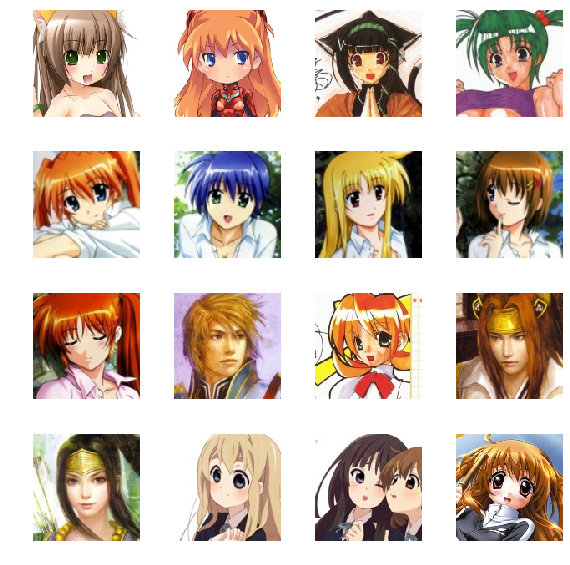

In [10]:
show_samples(0,train_images[:16])

In [11]:
d_losses = []
g_losses = []

# with tf.Session() as sess:
#     sess.run(tf.global_variables_initializer()) 
#     z_batch = np.random.uniform(-1, 1, size=(BATCH_SIZE, NOISE_DIM))
#     g_plot = sess.run(g_sample, feed_dict={z: z_batch})
#     show_samples(g_plot[:16])

def train(epochs, batch_size=64):
    # training of (6000,128,128,3)
    m = train_images.shape[0] # number of training examples
    batch_count = m/batch_size # number of minibatches
    print ('Epochs:', epochs)
    print ('Batch size:', batch_size)
    print ('Batches per epoch:', batch_count)
    
    saver = tf.train.Saver(max_to_keep=4, keep_checkpoint_every_n_hours=2)
    
    # number of mini batches of size batch_size in your partitionning
    num_complete_minibatches = math.floor(batch_count)
    
    with tf.Session() as sess:
        # initialize variables otherwise FailedPreconditionError
        sess.run(tf.global_variables_initializer()) 
        
        for e in range(1, epochs+1):
            
            # minibatches without the end case
            for i in tqdm(range(0,num_complete_minibatches)):
                x_batch = train_images[i*batch_size:(i+1)*batch_size]
                z_batch = np.random.uniform(-1, 1, size=(BATCH_SIZE, NOISE_DIM))
#                 print(x_batch.shape)
#                 print(z_batch.shape)
                
                _, dloss = sess.run([d_step, d_loss], feed_dict={x: x_batch , z: z_batch})   
                _, gloss = sess.run([g_step, g_loss], feed_dict={z: z_batch})
                
#             print('end batch')
            # Handling the end case (last mini-batch < mini_batch_size) <32
            if m % batch_size != 0:
                x_batch = train_images[batch_size*num_complete_minibatches:]
                z_batch = np.random.uniform(-1, 1, size=(x_batch.shape[0], NOISE_DIM)) # solution to <32 minibatch problem
#                 print(x_batch.shape)
#                 print(z_batch.shape)
                
                _, dloss = sess.run([d_step, d_loss], feed_dict={x: x_batch , z: z_batch})   
                _, gloss = sess.run([g_step, g_loss], feed_dict={z: z_batch})
                
            print ("Epoch: %d\t Discriminator loss: %.4f\t Generator loss: %.4f"%(e,dloss,gloss))

            if e == 1 or e % 5 == 0:
                z_batch = np.random.uniform(-1, 1, size=(BATCH_SIZE, NOISE_DIM))
                g_plot = sess.run(g_sample, feed_dict={z: z_batch})
                show_samples(e, g_plot[:16])
                
            if e % 25 == 0:
                saver.save(sess,'model/dcgan-model',global_step=e)

            d_losses.append(dloss)
            g_losses.append(gloss)

Epochs: 300
Batch size: 32
Batches per epoch: 187.5


100%|██████████| 187/187 [02:51<00:00,  1.09it/s]


Epoch: 1	 Discriminator loss: 2.8427	 Generator loss: 0.6688


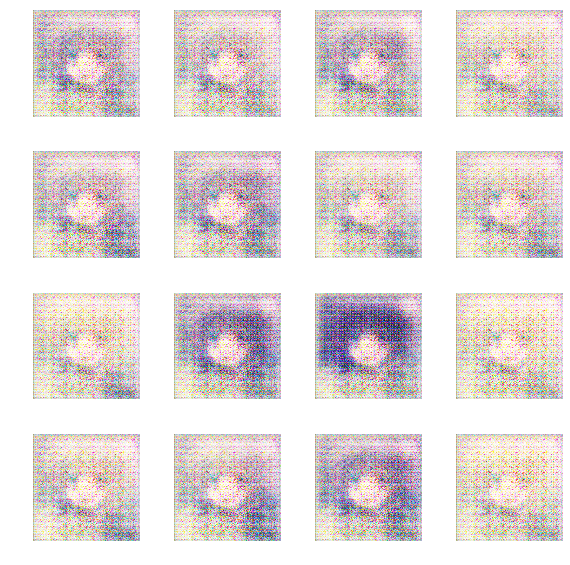

100%|██████████| 187/187 [02:52<00:00,  1.07it/s]


Epoch: 2	 Discriminator loss: 2.3050	 Generator loss: 1.0608


100%|██████████| 187/187 [02:51<00:00,  1.12it/s]


Epoch: 3	 Discriminator loss: 1.7166	 Generator loss: 0.8119


100%|██████████| 187/187 [02:47<00:00,  1.11it/s]


Epoch: 4	 Discriminator loss: 1.6675	 Generator loss: 0.9323


100%|██████████| 187/187 [02:48<00:00,  1.12it/s]


Epoch: 5	 Discriminator loss: 1.4907	 Generator loss: 0.8097


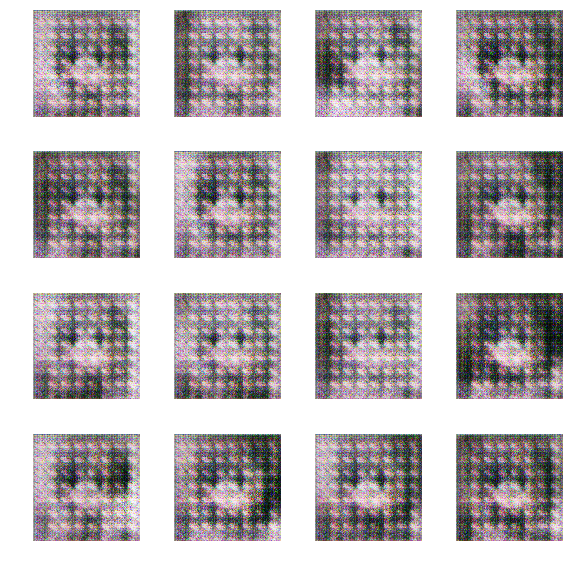

100%|██████████| 187/187 [02:48<00:00,  1.12it/s]


Epoch: 6	 Discriminator loss: 1.6277	 Generator loss: 0.7507


100%|██████████| 187/187 [02:48<00:00,  1.12it/s]


Epoch: 7	 Discriminator loss: 1.4009	 Generator loss: 0.8274


100%|██████████| 187/187 [02:48<00:00,  1.10it/s]


Epoch: 8	 Discriminator loss: 1.5621	 Generator loss: 0.8330


100%|██████████| 187/187 [02:49<00:00,  1.10it/s]


Epoch: 9	 Discriminator loss: 1.6088	 Generator loss: 0.6835


100%|██████████| 187/187 [02:49<00:00,  1.10it/s]


Epoch: 10	 Discriminator loss: 1.7840	 Generator loss: 0.8558


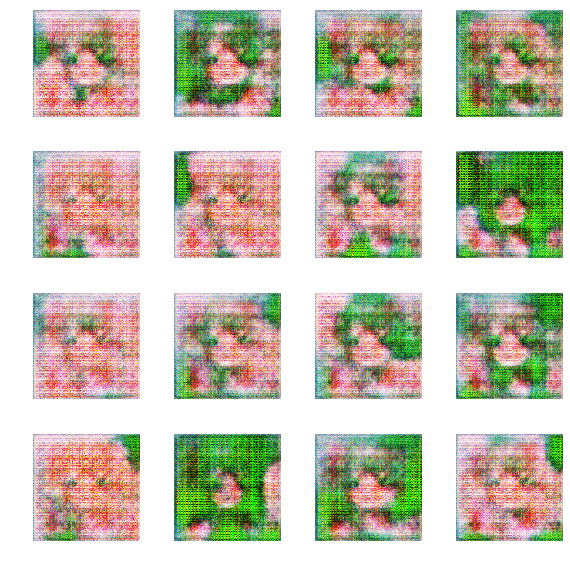

100%|██████████| 187/187 [02:49<00:00,  1.10it/s]


Epoch: 11	 Discriminator loss: 1.5324	 Generator loss: 0.7157


100%|██████████| 187/187 [02:49<00:00,  1.10it/s]


Epoch: 12	 Discriminator loss: 1.5870	 Generator loss: 0.8493


100%|██████████| 187/187 [02:49<00:00,  1.10it/s]


Epoch: 13	 Discriminator loss: 1.5886	 Generator loss: 1.0777


100%|██████████| 187/187 [02:49<00:00,  1.09it/s]


Epoch: 14	 Discriminator loss: 1.5312	 Generator loss: 0.9300


100%|██████████| 187/187 [02:49<00:00,  1.10it/s]


Epoch: 15	 Discriminator loss: 1.3682	 Generator loss: 0.8475


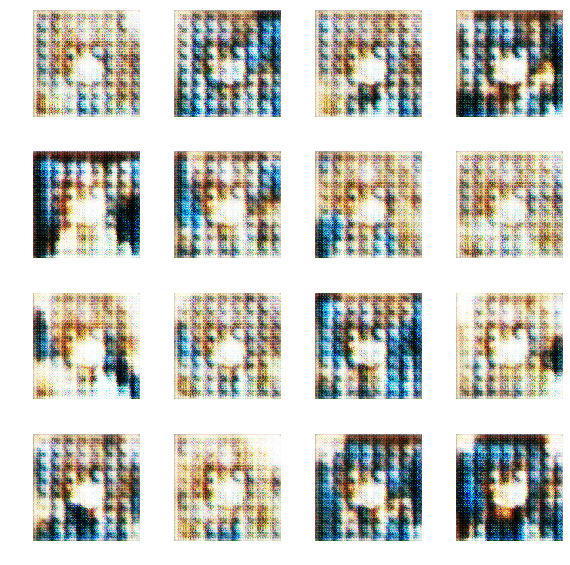

100%|██████████| 187/187 [02:49<00:00,  1.11it/s]


Epoch: 16	 Discriminator loss: 1.4507	 Generator loss: 0.8793


100%|██████████| 187/187 [02:49<00:00,  1.09it/s]


Epoch: 17	 Discriminator loss: 1.3654	 Generator loss: 1.0504


100%|██████████| 187/187 [02:49<00:00,  1.10it/s]


Epoch: 18	 Discriminator loss: 1.5519	 Generator loss: 1.0483


100%|██████████| 187/187 [02:49<00:00,  1.10it/s]


Epoch: 19	 Discriminator loss: 1.3317	 Generator loss: 0.9176


100%|██████████| 187/187 [02:49<00:00,  1.11it/s]


Epoch: 20	 Discriminator loss: 1.5134	 Generator loss: 0.8152


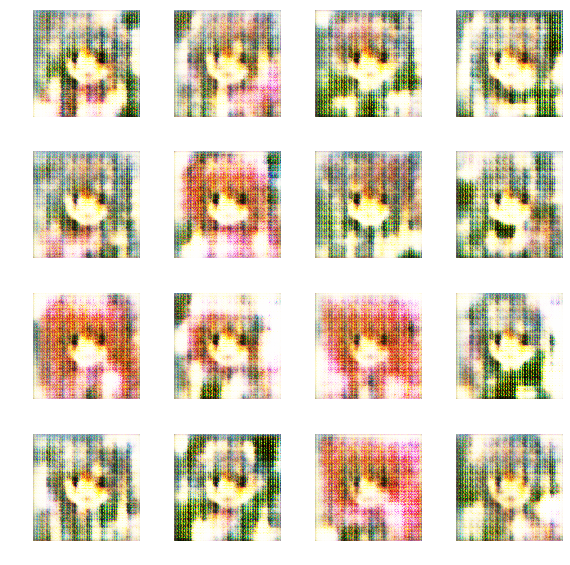

100%|██████████| 187/187 [02:49<00:00,  1.10it/s]


Epoch: 21	 Discriminator loss: 1.1717	 Generator loss: 1.0480


100%|██████████| 187/187 [02:49<00:00,  1.10it/s]


Epoch: 22	 Discriminator loss: 1.2016	 Generator loss: 0.9135


100%|██████████| 187/187 [02:49<00:00,  1.10it/s]


Epoch: 23	 Discriminator loss: 1.5360	 Generator loss: 0.7962


100%|██████████| 187/187 [02:49<00:00,  1.09it/s]


Epoch: 24	 Discriminator loss: 1.5499	 Generator loss: 0.8483


100%|██████████| 187/187 [02:49<00:00,  1.10it/s]


Epoch: 25	 Discriminator loss: 1.4326	 Generator loss: 0.9883


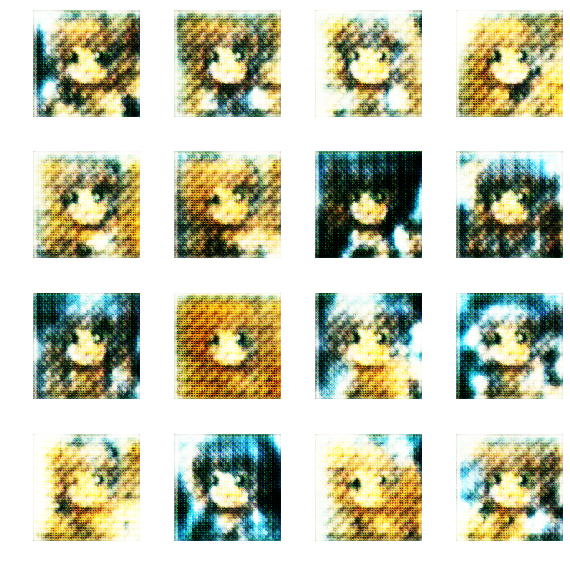

100%|██████████| 187/187 [02:48<00:00,  1.11it/s]


Epoch: 26	 Discriminator loss: 1.4093	 Generator loss: 0.8048


100%|██████████| 187/187 [02:49<00:00,  1.11it/s]


Epoch: 27	 Discriminator loss: 1.4262	 Generator loss: 0.7132


100%|██████████| 187/187 [02:49<00:00,  1.11it/s]


Epoch: 28	 Discriminator loss: 1.4158	 Generator loss: 0.9012


100%|██████████| 187/187 [02:49<00:00,  1.10it/s]


Epoch: 29	 Discriminator loss: 1.1870	 Generator loss: 0.8789


100%|██████████| 187/187 [02:49<00:00,  1.11it/s]


Epoch: 30	 Discriminator loss: 1.4061	 Generator loss: 0.9084


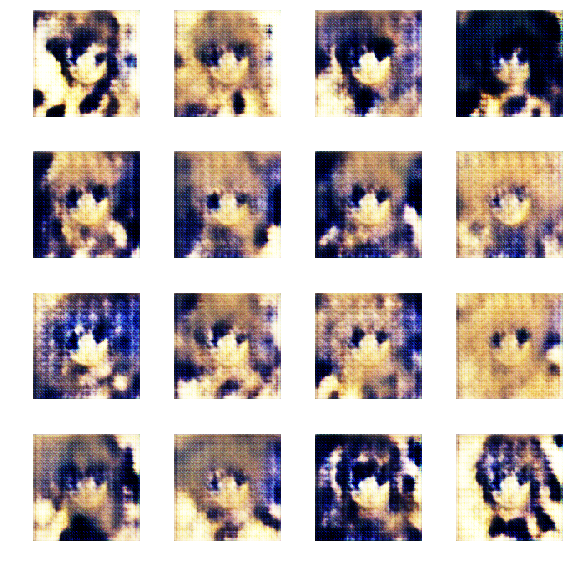

100%|██████████| 187/187 [02:49<00:00,  1.10it/s]


Epoch: 31	 Discriminator loss: 1.4529	 Generator loss: 0.8754


100%|██████████| 187/187 [02:49<00:00,  1.10it/s]


Epoch: 32	 Discriminator loss: 1.3334	 Generator loss: 0.9728


100%|██████████| 187/187 [02:49<00:00,  1.10it/s]


Epoch: 33	 Discriminator loss: 1.2904	 Generator loss: 1.2135


100%|██████████| 187/187 [02:50<00:00,  1.10it/s]


Epoch: 34	 Discriminator loss: 1.4162	 Generator loss: 0.8848


100%|██████████| 187/187 [02:49<00:00,  1.10it/s]


Epoch: 35	 Discriminator loss: 1.3629	 Generator loss: 0.9789


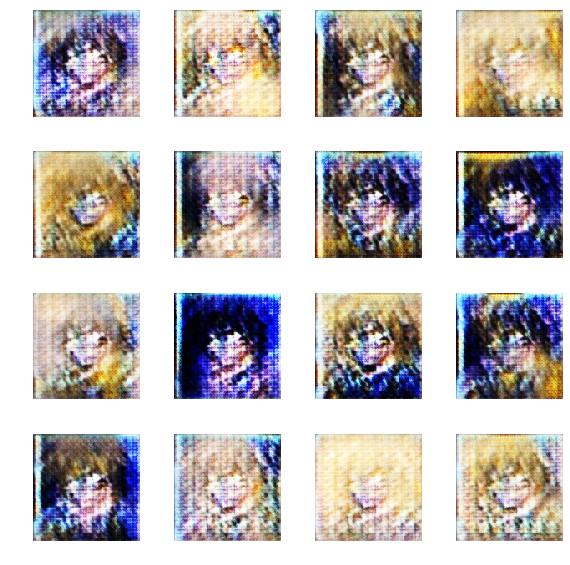

100%|██████████| 187/187 [02:49<00:00,  1.10it/s]


Epoch: 36	 Discriminator loss: 1.2129	 Generator loss: 1.0877


100%|██████████| 187/187 [02:49<00:00,  1.11it/s]


Epoch: 37	 Discriminator loss: 1.3495	 Generator loss: 0.9695


100%|██████████| 187/187 [02:49<00:00,  1.10it/s]


Epoch: 38	 Discriminator loss: 1.4597	 Generator loss: 1.3320


100%|██████████| 187/187 [02:50<00:00,  1.10it/s]


Epoch: 39	 Discriminator loss: 1.4689	 Generator loss: 0.8727


100%|██████████| 187/187 [02:50<00:00,  1.11it/s]


Epoch: 40	 Discriminator loss: 1.3709	 Generator loss: 1.0306


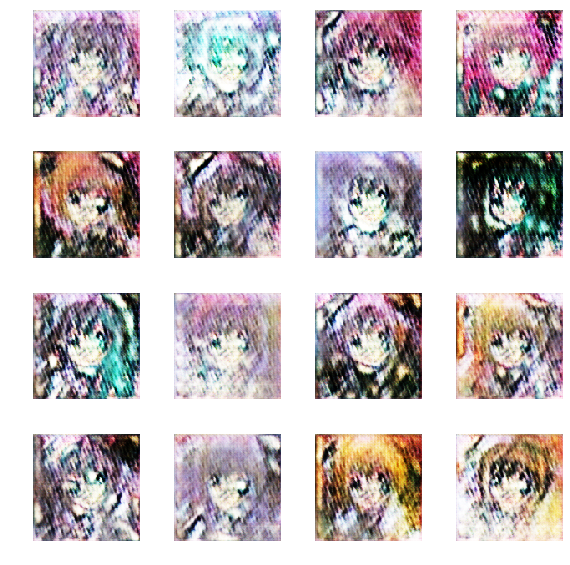

100%|██████████| 187/187 [02:50<00:00,  1.10it/s]


Epoch: 41	 Discriminator loss: 1.3460	 Generator loss: 0.9903


100%|██████████| 187/187 [02:50<00:00,  1.10it/s]


Epoch: 42	 Discriminator loss: 1.3335	 Generator loss: 1.1248


100%|██████████| 187/187 [02:50<00:00,  1.11it/s]


Epoch: 43	 Discriminator loss: 1.1739	 Generator loss: 1.2904


100%|██████████| 187/187 [02:48<00:00,  1.11it/s]


Epoch: 44	 Discriminator loss: 1.3327	 Generator loss: 1.1950


100%|██████████| 187/187 [02:49<00:00,  1.11it/s]


Epoch: 45	 Discriminator loss: 1.2223	 Generator loss: 1.1895


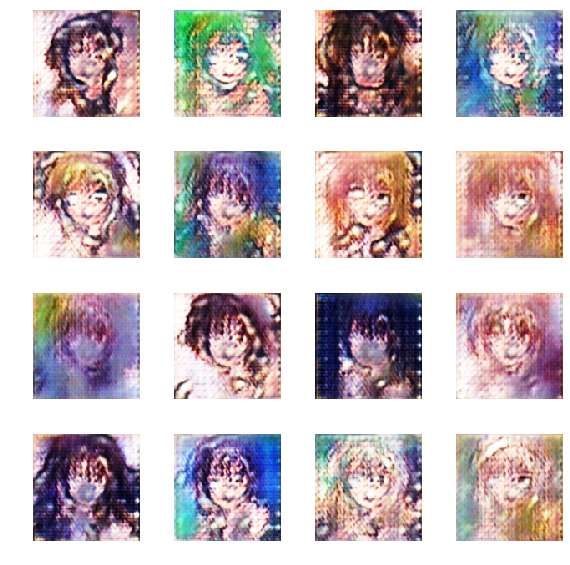

100%|██████████| 187/187 [02:49<00:00,  1.08it/s]


Epoch: 46	 Discriminator loss: 1.1723	 Generator loss: 1.1876


100%|██████████| 187/187 [02:49<00:00,  1.11it/s]


Epoch: 47	 Discriminator loss: 1.2429	 Generator loss: 1.5838


100%|██████████| 187/187 [02:48<00:00,  1.11it/s]


Epoch: 48	 Discriminator loss: 1.1486	 Generator loss: 1.4203


100%|██████████| 187/187 [02:48<00:00,  1.11it/s]


Epoch: 49	 Discriminator loss: 1.4012	 Generator loss: 1.7912


100%|██████████| 187/187 [02:48<00:00,  1.11it/s]


Epoch: 50	 Discriminator loss: 1.3920	 Generator loss: 1.5774


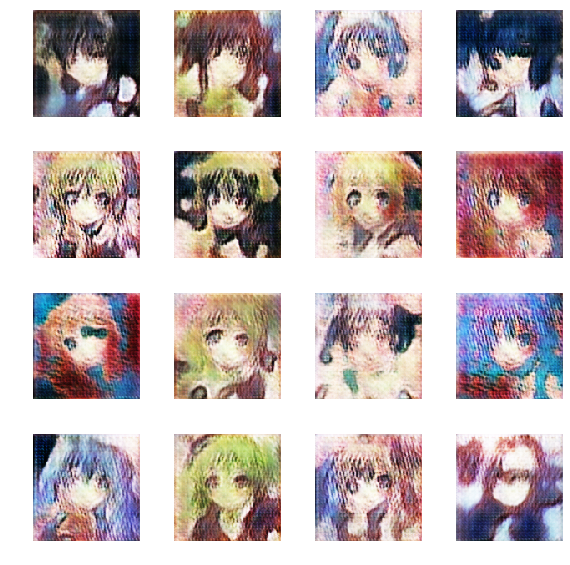

100%|██████████| 187/187 [02:47<00:00,  1.11it/s]


Epoch: 51	 Discriminator loss: 1.2830	 Generator loss: 1.9185


100%|██████████| 187/187 [02:48<00:00,  1.11it/s]


Epoch: 52	 Discriminator loss: 1.2605	 Generator loss: 1.6490


100%|██████████| 187/187 [02:48<00:00,  1.11it/s]


Epoch: 53	 Discriminator loss: 1.3256	 Generator loss: 1.8216


100%|██████████| 187/187 [02:49<00:00,  1.10it/s]


Epoch: 54	 Discriminator loss: 1.2859	 Generator loss: 2.2446


100%|██████████| 187/187 [02:48<00:00,  1.10it/s]


Epoch: 55	 Discriminator loss: 1.0445	 Generator loss: 2.7662


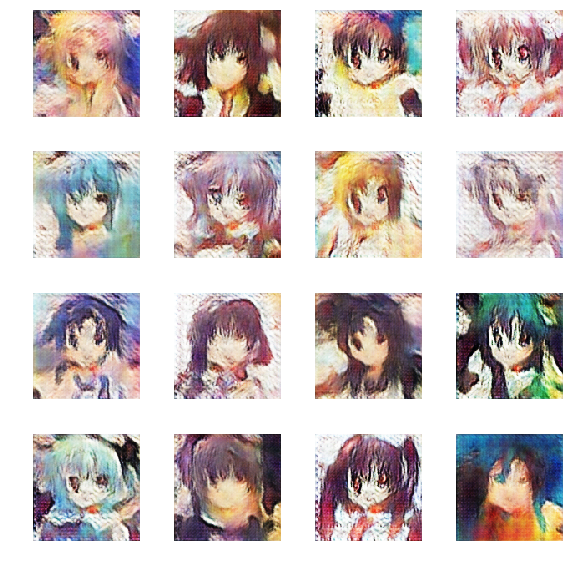

100%|██████████| 187/187 [02:48<00:00,  1.11it/s]


Epoch: 56	 Discriminator loss: 1.3901	 Generator loss: 1.1912


100%|██████████| 187/187 [02:48<00:00,  1.11it/s]


Epoch: 57	 Discriminator loss: 0.9062	 Generator loss: 1.2527


100%|██████████| 187/187 [02:48<00:00,  1.11it/s]


Epoch: 58	 Discriminator loss: 0.9740	 Generator loss: 2.5240


100%|██████████| 187/187 [02:48<00:00,  1.11it/s]


Epoch: 59	 Discriminator loss: 1.0541	 Generator loss: 1.2935


100%|██████████| 187/187 [02:48<00:00,  1.11it/s]


Epoch: 60	 Discriminator loss: 1.1259	 Generator loss: 1.0948


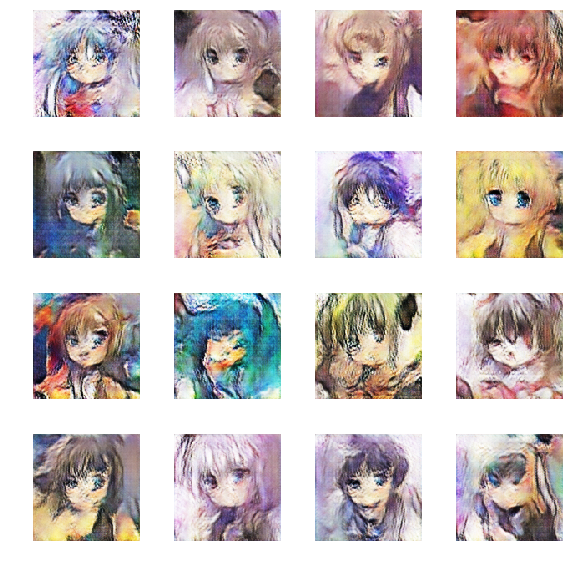

100%|██████████| 187/187 [02:48<00:00,  1.10it/s]


Epoch: 61	 Discriminator loss: 1.0414	 Generator loss: 2.0302


100%|██████████| 187/187 [02:48<00:00,  1.11it/s]


Epoch: 62	 Discriminator loss: 0.9051	 Generator loss: 2.3381


100%|██████████| 187/187 [02:48<00:00,  1.10it/s]


Epoch: 63	 Discriminator loss: 0.9698	 Generator loss: 2.0564


100%|██████████| 187/187 [02:48<00:00,  1.10it/s]


Epoch: 64	 Discriminator loss: 1.2695	 Generator loss: 3.2877


100%|██████████| 187/187 [02:48<00:00,  1.11it/s]


Epoch: 65	 Discriminator loss: 0.6838	 Generator loss: 1.9620


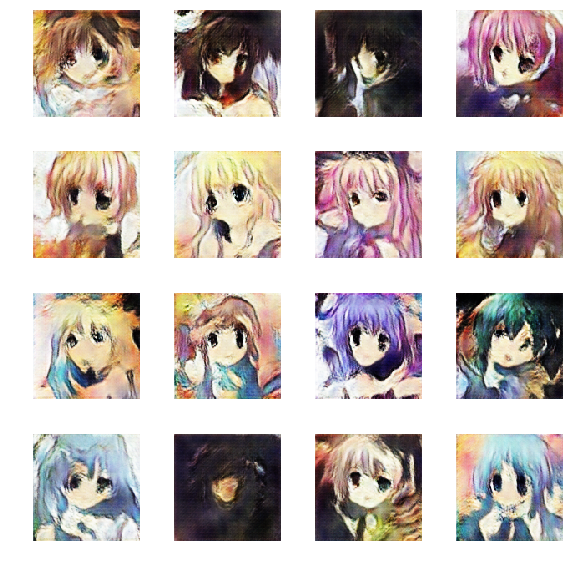

100%|██████████| 187/187 [02:48<00:00,  1.11it/s]


Epoch: 66	 Discriminator loss: 1.0803	 Generator loss: 3.0045


100%|██████████| 187/187 [02:48<00:00,  1.11it/s]


Epoch: 67	 Discriminator loss: 1.5256	 Generator loss: 3.8742


100%|██████████| 187/187 [02:48<00:00,  1.11it/s]


Epoch: 68	 Discriminator loss: 0.8685	 Generator loss: 2.1614


100%|██████████| 187/187 [02:48<00:00,  1.11it/s]


Epoch: 69	 Discriminator loss: 0.4984	 Generator loss: 2.5973


100%|██████████| 187/187 [02:48<00:00,  1.11it/s]


Epoch: 70	 Discriminator loss: 1.1305	 Generator loss: 0.8597


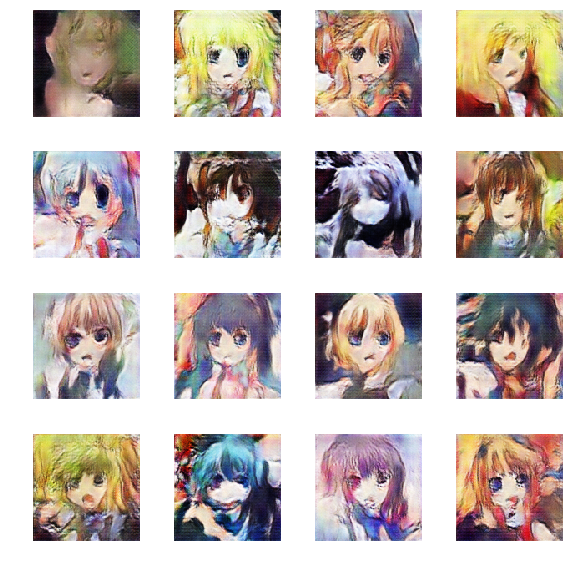

100%|██████████| 187/187 [02:48<00:00,  1.11it/s]


Epoch: 71	 Discriminator loss: 0.5645	 Generator loss: 3.6446


100%|██████████| 187/187 [02:48<00:00,  1.11it/s]


Epoch: 72	 Discriminator loss: 0.9131	 Generator loss: 5.7295


100%|██████████| 187/187 [02:48<00:00,  1.11it/s]


Epoch: 73	 Discriminator loss: 0.8574	 Generator loss: 3.5482


100%|██████████| 187/187 [02:48<00:00,  1.11it/s]


Epoch: 74	 Discriminator loss: 0.8738	 Generator loss: 2.3748


100%|██████████| 187/187 [02:48<00:00,  1.11it/s]


Epoch: 75	 Discriminator loss: 0.6026	 Generator loss: 3.7628


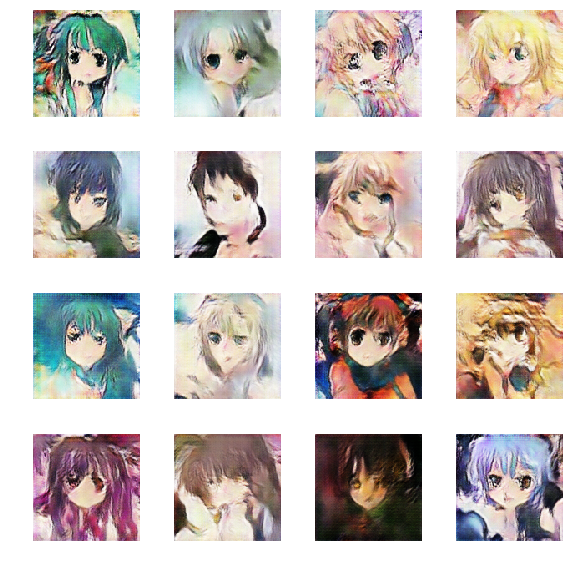

100%|██████████| 187/187 [02:48<00:00,  1.11it/s]


Epoch: 76	 Discriminator loss: 0.5023	 Generator loss: 2.3476


100%|██████████| 187/187 [02:48<00:00,  1.11it/s]


Epoch: 77	 Discriminator loss: 0.4052	 Generator loss: 2.7093


100%|██████████| 187/187 [02:48<00:00,  1.11it/s]


Epoch: 78	 Discriminator loss: 0.7349	 Generator loss: 1.5826


100%|██████████| 187/187 [02:48<00:00,  1.11it/s]


Epoch: 79	 Discriminator loss: 0.2994	 Generator loss: 2.8770


100%|██████████| 187/187 [02:48<00:00,  1.11it/s]


Epoch: 80	 Discriminator loss: 0.4408	 Generator loss: 3.9500


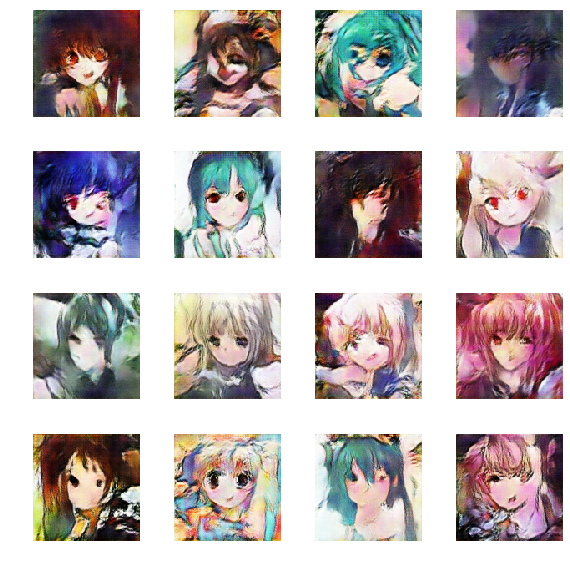

100%|██████████| 187/187 [02:48<00:00,  1.11it/s]


Epoch: 81	 Discriminator loss: 0.2045	 Generator loss: 1.5949


100%|██████████| 187/187 [02:48<00:00,  1.11it/s]


Epoch: 82	 Discriminator loss: 0.9222	 Generator loss: 0.7311


100%|██████████| 187/187 [02:48<00:00,  1.11it/s]


Epoch: 83	 Discriminator loss: 0.3302	 Generator loss: 2.7471


100%|██████████| 187/187 [02:48<00:00,  1.11it/s]


Epoch: 84	 Discriminator loss: 0.4276	 Generator loss: 4.5190


100%|██████████| 187/187 [02:48<00:00,  1.11it/s]


Epoch: 85	 Discriminator loss: 0.3243	 Generator loss: 3.4847


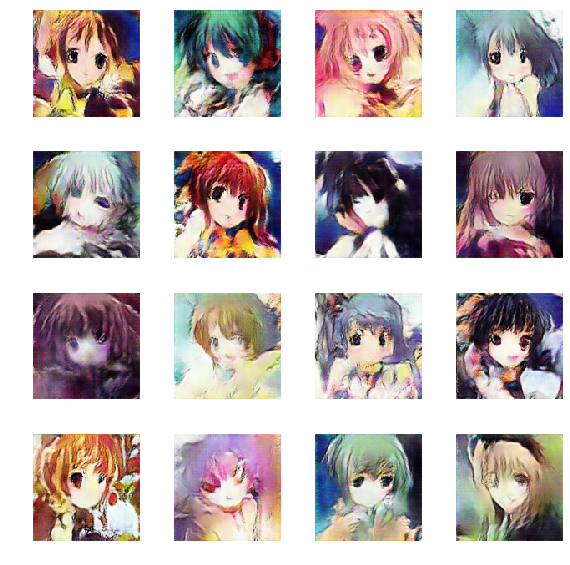

100%|██████████| 187/187 [03:00<00:00,  1.28s/it]


Epoch: 86	 Discriminator loss: 0.2121	 Generator loss: 3.9161


100%|██████████| 187/187 [03:34<00:00,  1.10it/s]


Epoch: 87	 Discriminator loss: 0.1347	 Generator loss: 4.7367


100%|██████████| 187/187 [03:15<00:00,  1.09s/it]


Epoch: 88	 Discriminator loss: 0.3255	 Generator loss: 3.4844


100%|██████████| 187/187 [03:22<00:00,  1.09s/it]


Epoch: 89	 Discriminator loss: 0.3157	 Generator loss: 4.4004


100%|██████████| 187/187 [03:21<00:00,  1.07s/it]


Epoch: 90	 Discriminator loss: 0.1151	 Generator loss: 5.3528


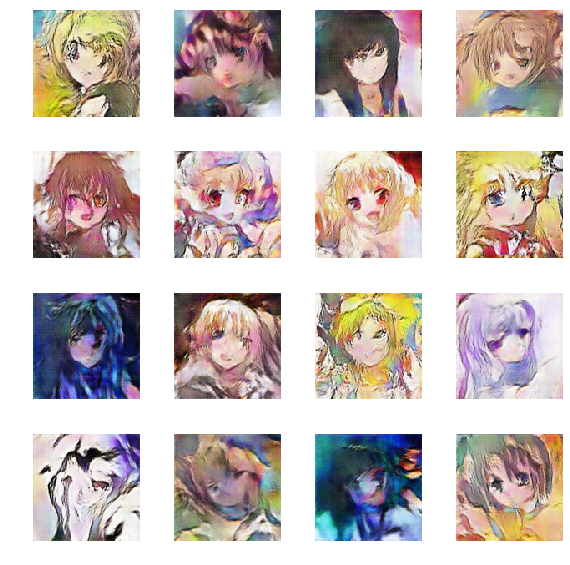

100%|██████████| 187/187 [03:21<00:00,  1.08s/it]


Epoch: 91	 Discriminator loss: 0.1545	 Generator loss: 4.2794


100%|██████████| 187/187 [03:21<00:00,  1.07s/it]


Epoch: 92	 Discriminator loss: 0.9997	 Generator loss: 4.0046


100%|██████████| 187/187 [03:21<00:00,  1.07s/it]


Epoch: 93	 Discriminator loss: 0.1102	 Generator loss: 5.2669


100%|██████████| 187/187 [03:49<00:00,  1.31s/it]


Epoch: 94	 Discriminator loss: 0.3156	 Generator loss: 6.0777


 45%|████▍     | 84/187 [02:48<12:03,  7.03s/it]

InternalError: GPU sync failed

In [12]:
train(EPOCHS, batch_size=BATCH_SIZE)

In [ ]:
plt.show()